# Denoising

Given a noisy image, we want to find a denoised version of the image. In this part of the project, You will do the following:-

-  From true images, create a noisy training dataset
-  Visualize Different types of noisy images and comment on the differences
-  Using different models find denoised images.
-  Visualize noisy and their denoised counter parts for atleast 2-5 input samples for analysis.
-  Analyze which models give good results and why ?

*** Extra Python libraries(Pytorch, pandas, csv) are needed for this assignment. So please ensure the cell directly below excutes properly before proceeding with the assignment. If it doesn't please make sure to install those libraries before hand. ***

*** If you don't have access to GPU on your computer then install a CPU version of the pytorch library.  Required comments are provided to run the code on a CPU machine. Training on CPU is consideraly slower, so we would advise  you to use CADE machine for this assignment. CADE machine as 4GB GPU's which are enough for this project. ***

In [4]:
import pandas as pd
from skimage import io
import matplotlib.pyplot as plt
import numpy as np
import random
import skimage as ski
from skimage import io, transform
import csv
import os
import random
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as transforms
import torch.optim as optim
import sys
sys.path.insert(1, '../../utils')
from utils import NoiseDatsetLoader

ImportError: cannot import name 'NoiseDatsetLoader' from 'utils' (C:\Users\zyj\anaconda3\lib\site-packages\utils\__init__.py)

# Adding Noise in the Images And Creating a Noisy Dataset

In [5]:
from skimage.util import random_noise
def noiseAddtion(image,noiseIndicator):
    # This function gets an image of size m x n. Range of values is (0,1).
    # noiseIndicator is type of noise that needs to be added to the image
    # noiseIndicator == 0 indicates an addition of gaussian noise with mean 0 and var 0.08
    # noiseIndicator == 1 indicates an addtion of Salt and Pepper noise with intensity variation of 0.08
    # noiseIndicator == 2 indicates an addition of poisson noise
    # noiseIndicator == 3 indicates an addition of Speckle noise of mean 0 and var 0.05
    
    ## This function should return a noisy version of the input image
    ## Part of the code cite from https://stackoverflow.com/questions/59872616/how-to-add-noise-using-skimage
    ##  ***************** Your Code starts here ***************** ##
    if noiseIndicator == 0: # gaussian noise
        return random_noise(image, mode='gaussian', seed=None, clip=True, mean=0, var=0.08)
    elif noiseIndicator == 1: # salt and pepper
        return random_noise(image, mode='s&p', seed=None, clip=True, salt_vs_pepper=0.08)
    elif noiseIndicator == 2: # Possion noise
        return random_noise(image, mode='poisson', seed=None, clip=True)
    elif noiseIndicator == 3: # Speckle noise
        return random_noise(image, mode='speckle', seed=None, clip=True, mean=0, var=0.05)
    else:
        print("Unknown indicator")
        print(noiseIndicator)
        return image
    ## ***************** Your Code ends here ***************** ##

In [6]:
def writeCSV(csv_file_name, Trainingdictlist):
    csv_columns = ['RefImageName','NoiseType','NoisyImage']
    try:
        with open(csv_file_name, 'w') as csvfile:
            writer = csv.DictWriter(csvfile, fieldnames=csv_columns)
            writer.writeheader()
            for data in Trainingdictlist:
                writer.writerow(data)
    except IOError:
        print("I/O error")

def createNoisyDataset(root_dir,train,numberOfSamples,noisyIndicatorLow,noisyIndicatorHigh):
    if(train==1):
        name_csv = pd.read_csv('../../utils/file_name_train.csv')
        csv_file_name = "TrainingDataSet.csv"
        directoryName = "TrainingDataset/"
        Trainingdictlist = [dict() for x in range(numberOfSamples)]
        if not os.path.exists(directoryName):
            os.makedirs(directoryName)
    else:
        name_csv = pd.read_csv('../../utils/file_name_test.csv')
        csv_file_name = "TestingDataSet.csv"
        directoryName = "TestingDataset/"
        Trainingdictlist = [dict() for x in range(numberOfSamples)]
        if not os.path.exists(directoryName):
            os.makedirs(directoryName)

    for i in range(numberOfSamples):
        r2 = random.randint(0,len(name_csv)-1) # Choose an image randomly from the dataset
        # Read the image from a path
        img_name = os.path.join(root_dir,name_csv.iloc[r2, 0])
        image    = io.imread(img_name)

        # Normalize the image to range (0,1) 
        M,N      = image.shape
        maximumPixelValue = np.max(image)
        image = image/maximumPixelValue

        # Choosing the noise randomly 
        r1 = random.randint(noisyIndicatorLow,noisyIndicatorHigh)
        noisyImage = noiseAddtion(image,r1)
        Trainingdictlist[i]={'RefImageName':img_name,'NoiseType': r1,'NoisyImage':str(i)+'.png'}
        io.imsave(directoryName+str(i)+'.png',noisyImage)
    writeCSV(csv_file_name, Trainingdictlist)

## The function below calls the above function to create a noisy training and testing dataset. 

Don't worry about lossy conversion warnings.

In [5]:
createNoisyDataset('../../utils/GrayScale',1,400,0,3) ## Creating 400 samples of Training Data
createNoisyDataset('../../utils/GrayScale',0,200,0,3) ## Creating 200 samples of Training Data

Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0

Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0

Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0

Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0

Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0

Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0

Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0

Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0

Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0

## Visualize Samples of Each of the noise Type here Using any plotting library

Hint:- You can use Subplots to display different noisy images

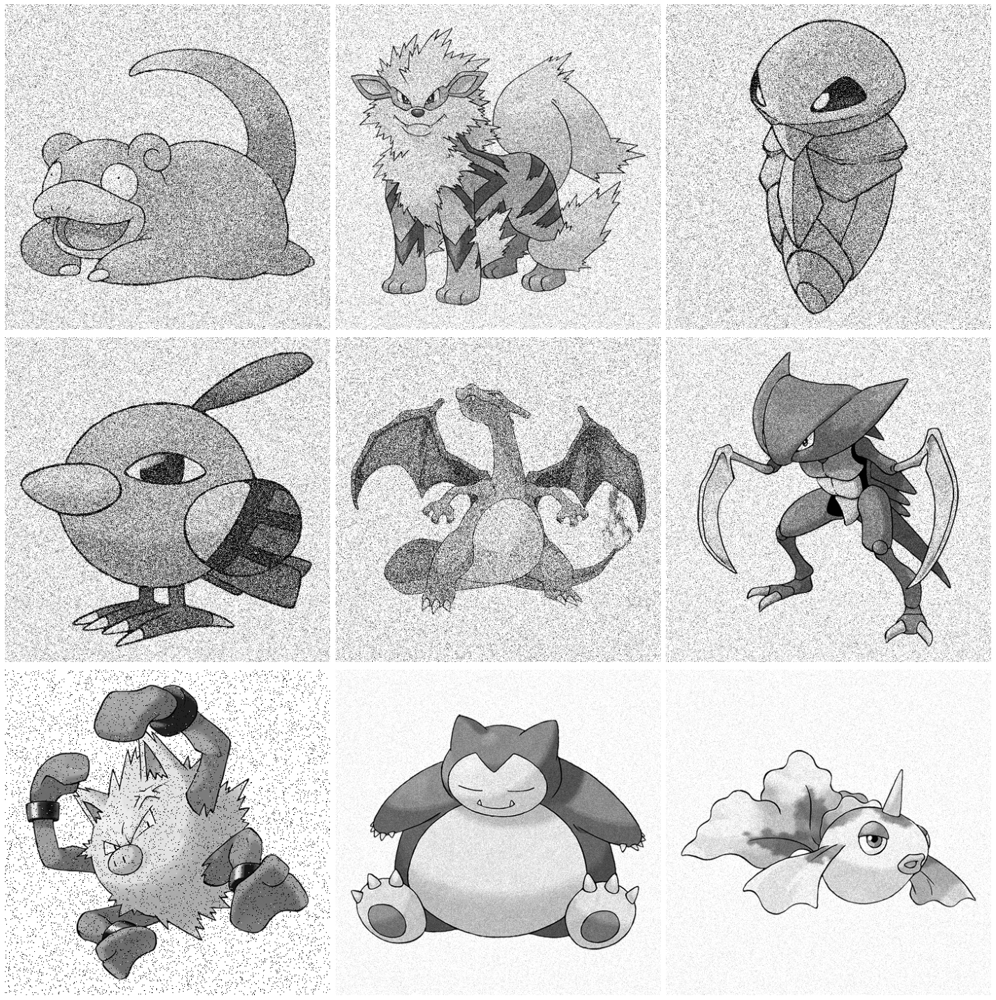

In [4]:
## Your Code Starts here

fig, ax = plt.subplots(nrows=3, ncols=3, figsize=(20, 20), sharex=True,
                       sharey=True)

plt.gray()
img1 = io.imread("TrainingDataset/1.png")
img2 = io.imread("TrainingDataset/3.png")
img3 = io.imread("TrainingDataset/5.png")
img4 = io.imread("TrainingDataset/7.png")
img5 = io.imread("TrainingDataset/9.png")
img6 = io.imread("TrainingDataset/11.png")
img7 = io.imread("TrainingDataset/13.png")
img8 = io.imread("TrainingDataset/15.png")
img9 = io.imread("TrainingDataset/17.png")


ax[0, 0].imshow(img1)
ax[0, 0].axis('off')
ax[0, 1].imshow(img2)
ax[0, 1].axis('off')
ax[0, 2].imshow(img3)
ax[0, 2].axis('off')
ax[1, 0].imshow(img4)
ax[1, 0].axis('off')
ax[1, 1].imshow(img5)
ax[1, 1].axis('off')
ax[1, 2].imshow(img6)
ax[1, 2].axis('off')
ax[2, 0].imshow(img7)
ax[2, 0].axis('off')
ax[2, 1].imshow(img8)
ax[2, 1].axis('off')
ax[2, 2].imshow(img9)
ax[2, 2].axis('off')
fig.tight_layout()

plt.show()
## Your Code ends here

## Comment on the Differences of different sample of noisy images

- Poisson noise is kind of the least noisy one
- Salt and pepper is straightforward, randomly replace with 1 and 0.
- Gaussian noise is mild
- Speckle noise seems have more intensity

# Neural Network for Denoising

We now have a noisy training set and a reference images.

In [6]:
dtype = torch.float32 ## instialize the data types used in training
my_device  = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
#cpu = torch.device("cpu")

## Complete the Training Function Below

In [7]:
import copy
def trainingLoop(dataloader,model,optimizer,nepochs):
    ## This function Trains your model for 'nepochs'
    ## Using optimizer and model your passed as arguments
    ## On the data present in the DataLoader class passed
    ##
    ## This function return the final loss values

    model = model.to(device=gpu)    
    
    ## Our Loss function for this exercise is fixed to MSELoss
    loss_function = nn.MSELoss()
    loss_array =[]
    for e in range(nepochs):
            
            running_lose = 0
            for t, temp in enumerate(dataloader):
                ## Before Training Starts, put model in Training Mode
                model.train()   
                NoisyImage = temp['NoisyImage'].to(device=gpu,dtype=dtype)
                #NoisyImage = torch.unsqueeze(NoisyImage,1)
                referenceImage = temp['image'].to(device=gpu,dtype=dtype)
                ## Pass your input images through the model
                ## Be sure to set the gradient as Zero in Optmizer before backward pass. Hint:- zero_grad()
                ## Step the otimizer on after backward pass
                ## calcualte the loss value using the ground truth and the output image
                ## Assign the value computed by the loss function to a varible named 'loss'

                ## Due to dataset being Gray you may have to use unsqueeze function here

                ## ************* Start of your Code *********************** ##

                ## Forward pass
                output = model(NoisyImage)

                # Calculate loss
                loss = loss_function(output, referenceImage)
            
                ## Set Gradients to Zero
                optimizer.zero_grad()
            
                ## Backward pass
                loss.backward()
            
                ## Optimizer Step
                optimizer.step()
                
                ## Add it up the Loss
                running_lose+=loss.item()
            acumulated_loss = running_lose/len(dataloader)
            loss_array.append(acumulated_loss)
            print("Epoch ",e,": ",acumulated_loss)
    best_trained_model=copy.deepcopy(model.state_dict())
    torch.save(best_trained_model,'./best_trained_model.pt')
    return loss_array

In [8]:
TrainingSet = NoiseDatsetLoader(csv_file='TrainingDataSet.csv', root_dir_noisy='TrainingDataset')
TestingSet  = NoiseDatsetLoader(csv_file='TestingDataSet.csv' , root_dir_noisy='TestingDataset')

## Batch Size is a hyper parameter, You may need to play with this paramter to get a more better network
## This is a user controlled parameter you can change this value


BatchSize =64

train_loader = DataLoader( TrainingSet  , batch_size=BatchSize,  num_workers=1)
test_loader  = DataLoader( TestingSet    , batch_size=1,  num_workers=1)


## Model 1 

- Declare a model with one conv2d filter with 1 input channel and output channel

In [9]:
# One single convolution layer
model1 = torch.nn.Sequential(torch.nn.Conv2d(1,1,kernel_size=(5,5),padding=2)                
)
## ************ End of your code ********************   ##


In [10]:
## Set your hypter parameters
learning_rate = 1e-3
weight_decay  = 1e-3
epochs =50

#epochs =  # Start with 50 or 100 and can experiment with value as high as 300-400.

## Optimizer
## Please Declare An Optimizer for your model. We suggest you use SGD
## ************* Start of your Code *********************** ##

optimizer = torch.optim.Adam(model1.parameters(), lr=learning_rate, betas=(0.9, 0.999), eps=1e-08, weight_decay=weight_decay)

## ************ End of your code ********************   ##

The anconda can't recognize the dataloader, so I run the code on a python script and read the loss array and model via file

In [15]:
#loss_array = trainingLoop(train_loader,model1,optimizer,epochs)
loss_array1 = np.loadtxt("loss_array1.txt")
best_model1 = model1
best_model1.load_state_dict(torch.load('./best_trained_model1.pt',map_location=my_device))
best_model1.eval()

Sequential(
  (0): Conv2d(1, 1, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
)

Mean Square Error for the testing Set for the trained model is  tensor(491.9776, device='cuda:0', grad_fn=<DivBackward0>)

### Plot the graph of loss vs epoch

Text(0, 0.5, 'loss')

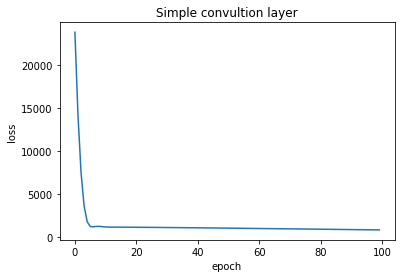

In [16]:
## ************* Start of your Code *********************** ##

fig, ax = plt.subplots()
ax.plot(loss_array1,label='Training loss')
plt.title("Simple convultion layer")
plt.xlabel("epoch")
plt.ylabel("loss")
## ************ End of your code ********************   ##

## Complete the Accuracy Function Below 

In [20]:
def checkTestingAccuracy(dataloader,model,gpu):
    ## This Function Checks Accuracy on Testing Dataset for the model passed
    ## This function should return the loss the Testing Dataset

    ## Before running on Testing Dataset the model should be in Evaluation Mode    
    model.eval()
    totalLoss = []
    loss_mse = nn.MSELoss()
    for t, temp in enumerate(dataloader):
        NoisyImage = temp['NoisyImage'].to(device=gpu,dtype=dtype)
        referenceImage = temp['image'].to(device=gpu,dtype=dtype)

        FilteredOutput = model(NoisyImage)
        #FilteredOutput = FilteredOutput.squeeze()
        ## For Each Test Image Calculate the MSE loss with respect to Reference Image 
        ## Return the mean the total loss on the whole Testing Dataset
        ## ************* Start of your Code *********************** ##
        output = loss_mse(NoisyImage, FilteredOutput)
        totalLoss.append(output)
        
    return sum(totalLoss) / len(totalLoss)
        ## ************ End of your code ********************   ##

In [21]:
## Test Your Model. Complete the implementation of checkTestingAccuracy function above 

testMSE = checkTestingAccuracy(test_loader,best_model1,my_device)
print("Mean Square Error for the testing Set for the trained model is ", testMSE)

Mean Square Error for the testing Set for the trained model is  tensor(1857.2153, grad_fn=<DivBackward0>)


## Plot some of the Testing Dataset images by passing them through the trained model

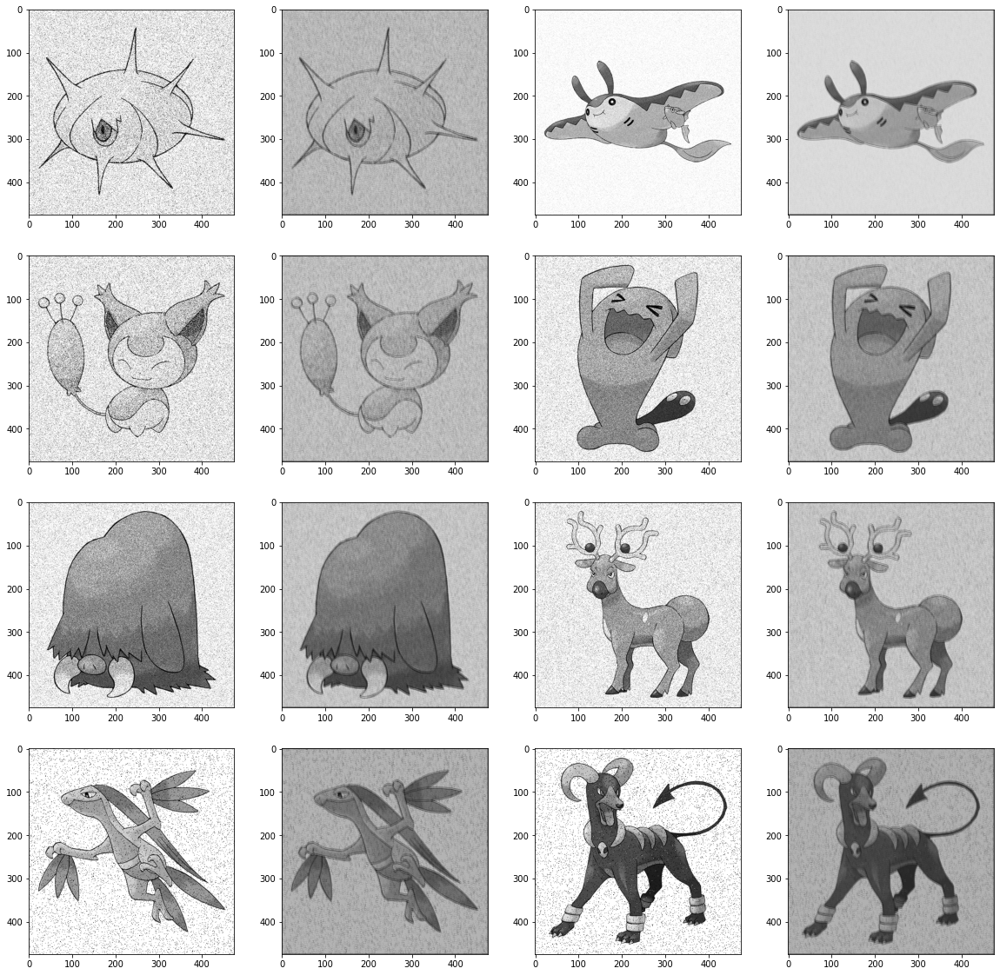

In [23]:
## Plot some of the Testing Dataset images by passing them through the trained model
## ************* Start of your Code *********************** ##

best_model = best_model1

    
fig, ax = plt.subplots(4,4)
fig.set_size_inches(20, 20)
for i in range(4):
    for j in range(2):
        index = np.random.randint(0,len(TestingSet))
        testDataPoint = TestingSet[index]
        testNoisyImage = torch.from_numpy(testDataPoint['NoisyImage'])
        testNoisyImage = testNoisyImage.to(device=my_device,dtype=dtype)

        testNoisyImage = testNoisyImage.unsqueeze(0)
        FilteredOutput = best_model(testNoisyImage)
        FilteredOutput = FilteredOutput.squeeze()

        im = ax[i][j*2].imshow(torch.squeeze(testNoisyImage.cpu()).numpy(),cmap='gray')
        im2 = ax[i][j*2+1].imshow(torch.squeeze(FilteredOutput.detach()).cpu().numpy(),cmap='gray')

## ************ End of your code ********************   ##

## Comment on the Denoised image Obtained

- The denoised images got are not great, the network just kind of averaging all the pixels. It seems that the network has blurred the image overall, but the denoise effect is too bad

# Model 2

- Declare a model with five conv2d filters, with input channel size of first filter as 1 and output channel size of last filter as 1. 
- All other intermediate channels you can change as you see fit( use a maximum of 8 or 16 channel inbetween layers, otherwise the model might take a huge amount of time to train). 
- Add batchnorm2d layers between each convolution layer for faster convergence.

In [24]:
## ************* Start of your Code *********************** ##

# Five convolution layer without activation Function
model2 = torch.nn.Sequential(torch.nn.Conv2d(1,2,kernel_size=(5,5),padding=2),
                          torch.nn.BatchNorm2d(2),
                          torch.nn.Conv2d(2,4,kernel_size=(5,5),padding=2),
                          torch.nn.BatchNorm2d(4),
                          torch.nn.Conv2d(4,8,kernel_size=(5,5),padding=2), 
                          torch.nn.BatchNorm2d(8),
                          torch.nn.Conv2d(8,4,kernel_size=(5,5),padding=2),
                          torch.nn.BatchNorm2d(4),
                          torch.nn.Conv2d(4,1,kernel_size=(5,5),padding=2),              
    )

## ************ End of your code ********************   ##

In [25]:
## Set your hypter parameters
learning_rate = 1e-3
weight_decay  = 1e-3
epochs =10

#epochs =  # Start with 50 or 100 and can experiment with value as high as 300-400.

## Optimizer
## Please Declare An Optimizer for your model. We suggest you use SGD
## ************* Start of your Code *********************** ##

optimizer = torch.optim.Adam(model2.parameters(), lr=learning_rate, betas=(0.9, 0.999), eps=1e-08, weight_decay=weight_decay)

## ************ End of your code ********************   ##

In [28]:
#loss_array = trainingLoop(dataloader_train,model2,optimizer,epochs,my_device)

loss_array = np.loadtxt("loss_array2.txt")
best_model2 = model2
best_model2.load_state_dict(torch.load('./best_trained_model2.pt',map_location=my_device))


<All keys matched successfully>

In [30]:
## Test Your Model
best_model2.eval()
testMSE = checkTestingAccuracy(test_loader,model2,my_device)
print("Mean Square Error for the testing Set for the trained model is ", testMSE)

Mean Square Error for the testing Set for the trained model is  tensor(1183.2119, grad_fn=<DivBackward0>)


## Plot some of the Testing Dataset images by passing them through the trained model

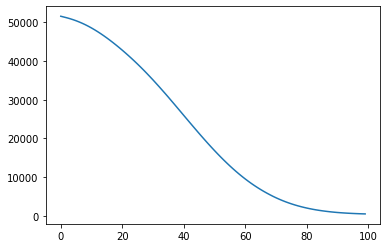

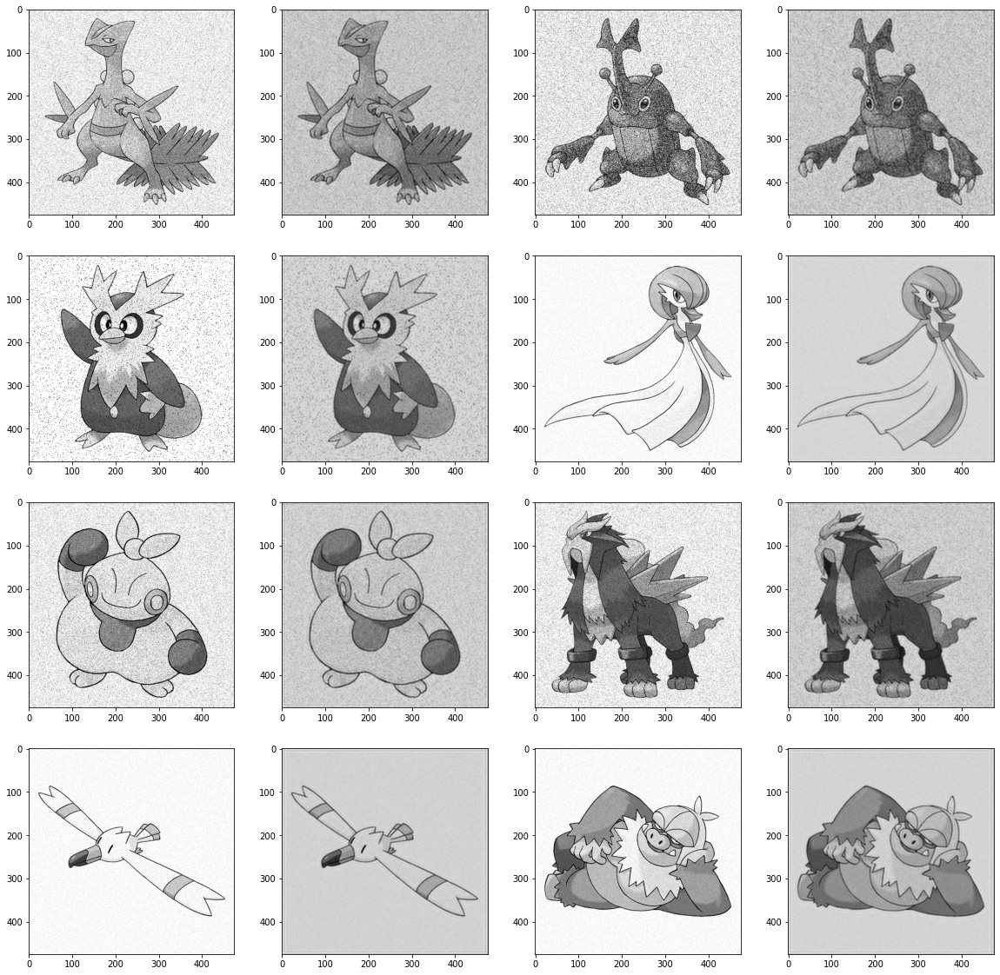

In [32]:
## ************* Start of your Code *********************** ##
## Plot some of the Testing Dataset images by passing them through the trained model
## ************* Start of your Code *********************** ##
fig, ax = plt.subplots()
ax.plot(loss_array,label='Training loss')

best_model = best_model2


    
fig, ax = plt.subplots(4,4)
fig.set_size_inches(20, 20)
for i in range(4):
    for j in range(2):
        index = np.random.randint(0,len(TestingSet))
        testDataPoint = TestingSet[index]
        testNoisyImage = torch.from_numpy(testDataPoint['NoisyImage'])
        testNoisyImage = testNoisyImage.to(device=my_device,dtype=dtype)

        testNoisyImage = testNoisyImage.unsqueeze(0)
        FilteredOutput = best_model(testNoisyImage)
        FilteredOutput = FilteredOutput.squeeze()

        im = ax[i][j*2].imshow(torch.squeeze(testNoisyImage.cpu()).numpy(),cmap='gray')
        im2 = ax[i][j*2+1].imshow(torch.squeeze(FilteredOutput.detach()).cpu().numpy(),cmap='gray')

## ************ End of your code ********************   ##

# Model 3

- Add Non Linear activations((preferably ReLU) Between conv2d layers from Model 2

In [33]:
## ************* Start of your Code *********************** ##

model3 = torch.nn.Sequential(torch.nn.Conv2d(1,2,kernel_size=(5,5),padding=2),
                          torch.nn.ReLU(),
                          torch.nn.BatchNorm2d(2),
                          torch.nn.Conv2d(2,4,kernel_size=(5,5),padding=2),
                          torch.nn.ReLU(),
                          torch.nn.BatchNorm2d(4),
                          torch.nn.Conv2d(4,8,kernel_size=(5,5),padding=2), 
                          torch.nn.ReLU(),
                          torch.nn.BatchNorm2d(8),
                          torch.nn.Conv2d(8,4,kernel_size=(5,5),padding=2),
                          torch.nn.ReLU(),
                          torch.nn.BatchNorm2d(4),
                          torch.nn.Conv2d(4,1,kernel_size=(5,5),padding=2),
    )


## ************* End of your Code *********************** ##

In [34]:
## Set your hypter parameters
learning_rate = 1e-3
weight_decay  = 1e-3
epochs =10

#epochs =  # Start with 50 or 100 and can experiment with value as high as 300-400.

## Optimizer
## Please Declare An Optimizer for your model. We suggest you use SGD
## ************* Start of your Code *********************** ##

optimizer = torch.optim.Adam(model3.parameters(), lr=learning_rate, betas=(0.9, 0.999), eps=1e-08, weight_decay=weight_decay)

## ************ End of your code ********************   ##

In [38]:
#loss_array = trainingLoop(dataloader_train,model3,optimizer,epochs,my_device)
loss_array = np.loadtxt("loss_array3.txt")
best_model3 = model3
best_model3.load_state_dict(torch.load('./best_trained_model3.pt',map_location=my_device))

<All keys matched successfully>

In [39]:
## Test Your Model
model3.eval()
testMSE = checkTestingAccuracy(test_loader,model3,my_device)
print("Mean Square Error for the testing Set for the trained model is ", testMSE)

Mean Square Error for the testing Set for the trained model is  tensor(1647.9692, grad_fn=<DivBackward0>)


## Plot some of the Testing Dataset images by passing them through the trained model

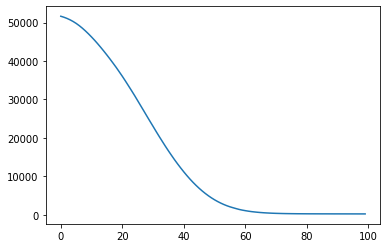

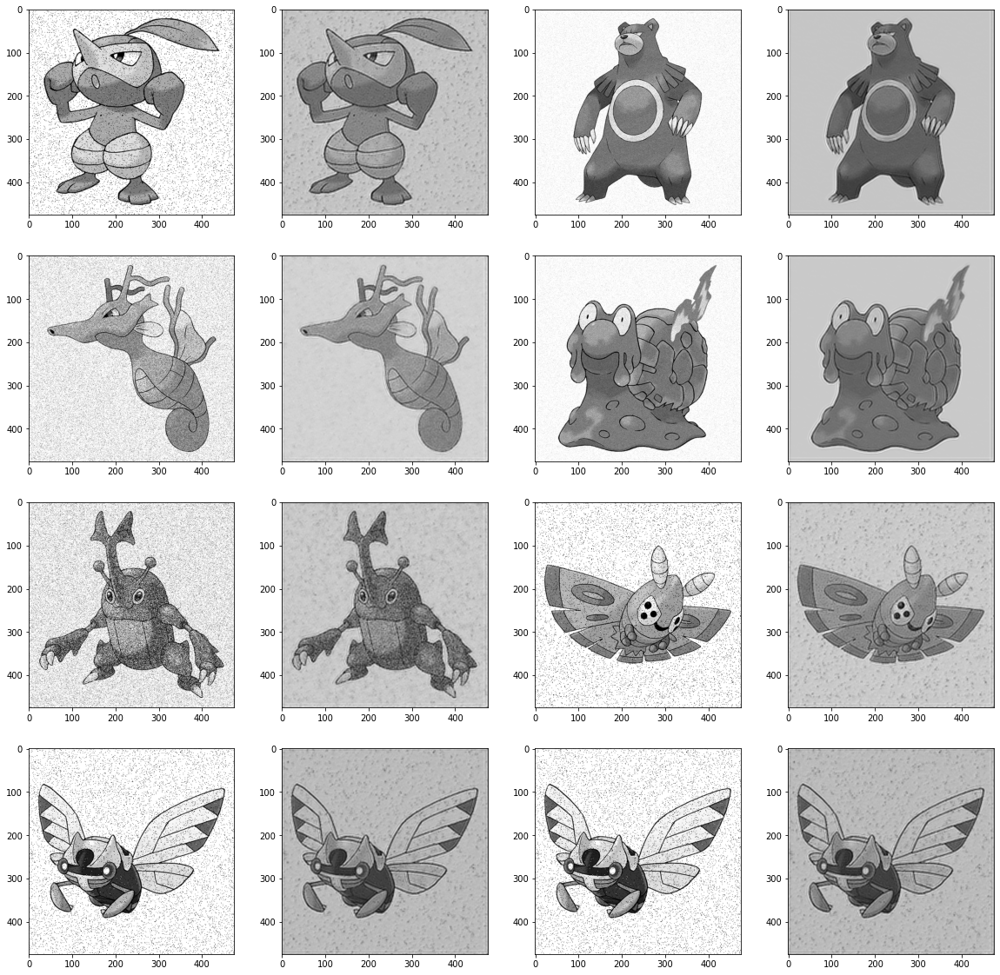

In [46]:
## ************* Start of your Code *********************** ##
## Plot some of the Testing Dataset images by passing them through the trained model
fig, ax = plt.subplots()
ax.plot(loss_array,label='Training loss')

best_model = best_model3

    
fig, ax = plt.subplots(4,4)
fig.set_size_inches(20, 20)
for i in range(4):
    for j in range(2):
        index = np.random.randint(0,len(TestingSet))
        testDataPoint = TestingSet[index]
        testNoisyImage = torch.from_numpy(testDataPoint['NoisyImage'])
        testNoisyImage = testNoisyImage.to(device=my_device,dtype=dtype)

        testNoisyImage = testNoisyImage.unsqueeze(0)
        FilteredOutput = best_model(testNoisyImage)
        FilteredOutput = FilteredOutput.squeeze()
        im = ax[i][j*2].imshow(torch.squeeze(testNoisyImage.cpu()).numpy(),cmap='gray')
        im2 = ax[i][j*2+1].imshow(torch.squeeze(FilteredOutput.detach()).cpu().numpy(),cmap='gray')

## ************ End of your code ********************   ##

# Analysis

Now that you have all the denoised outputs from different models, Answer the following questions.

a. Which Model performed best and why ??

Model3 performed best. Since it has more layers and nonlinear activated functions. Non-linear activated functions confined the loss function in a certain way. Therefore it performed better than the linear one.  

Different parameters will also affect the training. The learning rate determines how fast the loss function will converge. However, a large step size of the learning rate will harm the converge because the function will bounce at the bottom. Weight scale affects how the model is initialized. A multi-player network is very sensitive to this parameter. Different initial values were tried, 1e-2 was chosen to be the best one. Furthermore, a multi-layer network performed better than a single layer. The model worked well on possion noise, speckle noise than gaussian noise. Different sizes of the kernel also affect the training speed. I found that two 3*3 layers have the same effect as one 5*5 layer, but the previous one has a faster training rate. Therefore, more layers could improve the converging speed and reduce the cache use. 

In [25]:
## ************* Start of your Code *********************** ##
dtype = torch.float32 ## instialize the data types used in training
my_device  = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
#cpu = torch.device("cpu")
model3 = torch.nn.Sequential(torch.nn.Conv2d(1,2,kernel_size=(5,5),padding=2),
                          torch.nn.ReLU(),
                          torch.nn.BatchNorm2d(2),
                          torch.nn.Conv2d(2,4,kernel_size=(5,5),padding=2),
                          torch.nn.ReLU(),
                          torch.nn.BatchNorm2d(4),
                          torch.nn.Conv2d(4,8,kernel_size=(5,5),padding=2), 
                          torch.nn.ReLU(),
                          torch.nn.BatchNorm2d(8),
                          torch.nn.Conv2d(8,4,kernel_size=(5,5),padding=2),
                          torch.nn.ReLU(),
                          torch.nn.BatchNorm2d(4),
                          torch.nn.Conv2d(4,1,kernel_size=(5,5),padding=2),
    )


## ************* End of your Code *********************** ##
best_model3 = model3
best_model3.load_state_dict(torch.load('./best_trained_model3.pt',map_location=my_device))
for x in range(5):
    img_name = "img"+str(i+1)+".png"
    output_img_name = "output_img"+str(i+1)+".png"
    img = io.imread(img_name)
    img = np.true_divide(img, 256)
    img = torch.from_numpy(img)
    img = img.to(device=my_device,dtype=dtype)
    img = img.unsqueeze(0)
    
    denoise_img = best_model3(img)
    denoise_img = denoise_img.squeeze()
    
    io.imsave(output_img_name, denoise_img)
    #fig, ax = plt.subplots(1,2)
    #im = ax[1].imshow(torch.squeeze(noise_img.cpu()).numpy(),cmap='gray')
    #im2 = ax[2].imshow(torch.squeeze(denoise_img.detach()).cpu().numpy(),cmap='gray')

RuntimeError: Expected 4-dimensional input for 4-dimensional weight [2, 1, 5, 5], but got 3-dimensional input of size [1, 512, 512] instead